In [1]:
import datetime
import os

import pandas as pd

from base.training import mse_weighted
from common.model_utils import load_model_tflite

assert mse_weighted

# Baseline DF
BASE_MODEL_METADATA = load_model_tflite("models/zamg_vienna_2019_2019_simple_dense").metadata
df_baseline = pd.read_pickle("data/zamg_vienna_hourly.pickle")
df_baseline.dropna(inplace=True)

df_baseline

Using mse_weighted


,DD,FFAM,P,RF,RR,SO,TL,DD_sin,DD_cos,RR_norm
time,,,,,,,,,,
2010-01-01 01:00:00,335.0,0.5,971.5,93.0,0.0,0.0,4.7,-0.422618,0.906308,0.0
2010-01-01 01:10:00,342.0,0.6,971.6,92.0,0.0,0.0,4.8,-0.309017,0.951057,0.0
2010-01-01 01:20:00,92.0,1.4,971.5,92.0,0.0,0.0,4.7,0.999391,-0.034899,0.0
2010-01-01 01:30:00,82.0,1.1,971.4,93.0,0.0,0.0,4.7,0.990268,0.139173,0.0
2010-01-01 01:40:00,36.0,1.0,971.3,93.0,0.0,0.0,4.7,0.587785,0.809017,0.0
...,...,...,...,...,...,...,...,...,...,...
2021-12-31 23:10:00,282.0,9.8,999.2,59.0,0.0,0.0,15.3,-0.978148,0.207912,0.0
2021-12-31 23:20:00,278.0,9.4,999.3,59.0,0.0,0.0,15.2,-0.990268,0.139173,0.0
2021-12-31 23:30:00,283.0,10.0,999.3,59.0,0.0,0.0,15.2,-0.974370,0.224951,0.0


In [2]:
from typing import List


def preprocess_df(df: pd.DataFrame, features: List[str], periodicity: List[str]) -> pd.DataFrame:
    df = df.reindex(columns=features, copy=False)
    return df


sim_data: pd.DataFrame = df_baseline.loc[df_baseline.index.year >= 2020]
sim_data = preprocess_df(sim_data.copy(), BASE_MODEL_METADATA.input_features, [])

sim_data

,TL,P,RF,SO
time,,,,
2020-01-01 00:00:00,5.0,1012.4,60.0,0.0
2020-01-01 00:10:00,5.0,1012.5,60.0,0.0
2020-01-01 00:20:00,4.9,1012.5,61.0,0.0
2020-01-01 00:30:00,4.9,1012.5,61.0,0.0
2020-01-01 00:40:00,4.9,1012.6,60.0,0.0
...,...,...,...,...
2021-12-31 23:10:00,15.3,999.2,59.0,0.0
2021-12-31 23:20:00,15.2,999.3,59.0,0.0
2021-12-31 23:30:00,15.2,999.3,59.0,0.0


In [3]:
initial_df: pd.DataFrame = df_baseline.loc[df_baseline.index.year == 2019]
initial_df = preprocess_df(initial_df.copy(), BASE_MODEL_METADATA.input_features, [])
initial_df = initial_df.asfreq('H')

initial_df

,TL,P,RF,SO
time,,,,
2019-01-01 00:00:00,4.4,1009.3,81.0,0.0
2019-01-01 01:00:00,4.7,1009.3,80.0,0.0
2019-01-01 02:00:00,5.2,1008.8,79.0,0.0
2019-01-01 03:00:00,5.3,1007.9,81.0,0.0
2019-01-01 04:00:00,5.6,1006.8,81.0,0.0
...,...,...,...,...
2019-12-31 19:00:00,6.1,1011.0,60.0,0.0
2019-12-31 20:00:00,5.6,1011.2,60.0,0.0
2019-12-31 21:00:00,5.5,1011.6,60.0,0.0


In [4]:

from common.data_storage import DataStorage
from common.data_reduction_strategy import NoReductionStrategy
from base.learning_strategy import RetrainStrategy, NoUpdateStrategy
from base.cluster_executor import SequentialClusterExecutor
from base.cluster_planner import PortfolioClusterPlanner
from base.cluster_analyzer import PortfolioClusterAnalyzer
from base.cluster_monitor import ViolationsClusterMonitor
from sensor.sensor_executor import SequentialSensorExecutor
from sensor.sensor_planner import PortfolioSensorPlanner
from sensor.sensor_analyzer import PortfolioSensorAnalyzer
from sensor.sensor_monitor import MultivariateSensorMonitor
from base.cluster_adaptation_goal import FixedIntervalAdaptationGoal, DeployOnceAdaptationGoal
from sensor.base_station_gateway import BaseStationGateway
from sensor.multivariate_sensor_mock import MultivariateSensorMock
from typing import Tuple
import json
from common.resource_profiler import init_profiler, get_profiler, Profiler

from common.sensor_adaptation_goal import TimeWindowAdaptationGoal
from sensor.sensor_manager import SensorManager
from sensor.sensor_knowledge import SensorKnowledge

# Base Station configuration
data_storage = DataStorage(BASE_MODEL_METADATA.input_features, BASE_MODEL_METADATA.output_features)
data_storage.add_measurement_df(initial_df)

THRESHOLD = 1.0

seasons_portfolio = [
    "vienna_2016_2018_spring_simple_dense",
    "vienna_2016_2018_summer_simple_dense",
    "vienna_2016_2018_autumn_simple_dense",
    "vienna_2016_2018_winter_simple_dense",
]

sims = {
    "2019_2019_vienna_baseline": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy,
        "data_reduction_strategy": NoReductionStrategy()
    },
    "2019_2019_vienna_baseline_with_cooldown": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once", True),
        ],
        "learning_strategy": NoUpdateStrategy,
        "data_reduction_strategy": NoReductionStrategy()
    },
    "2016_2018_seasons": {
        "portfolio": seasons_portfolio,
        "base_model_id": "vienna_2016_2018_winter_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy,
        "data_reduction_strategy": NoReductionStrategy()
    },
    "2019_2019_vienna_retrain": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            FixedIntervalAdaptationGoal("fixed_interval_deploy", datetime.timedelta(seconds=60 * 60 * 24 * (366 / 4))),
        ],
        "learning_strategy": RetrainStrategy,
        "data_reduction_strategy": NoReductionStrategy()
    },
    "2019_2019_vienna_deploy_once_1v_1h": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2019_2019_vienna_deploy_once_1v_2h": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=2), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2019_2019_vienna_deploy_once_1v_3h": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=3), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2019_2019_vienna_deploy_once_2v_1h": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 2)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2019_2019_vienna_deploy_once_3v_1h": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 3)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2019_2019_vienna_deploy_once_2v_2h": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=2), 2)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2019_2019_vienna_deploy_once_2v_3h": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=3), 2)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2019_2019_vienna_deploy_once_3v_2h": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=2), 3)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy,
        "data_reduction_strategy": NoReductionStrategy()
    },
    "2019_2019_vienna_deploy_once_3v_3h": {
        "portfolio": ["zamg_vienna_2019_2019_simple_dense"],
        "base_model_id": "zamg_vienna_2019_2019_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=3), 3)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2016_2018_seasons_deploy_once_1v_1h": {
        "portfolio": seasons_portfolio,
        "base_model_id": "vienna_2016_2018_winter_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy,
        "data_reduction_strategy": NoReductionStrategy()
    },
    "2016_2018_seasons_deploy_once_1v_2h": {
        "portfolio": seasons_portfolio,
        "base_model_id": "vienna_2016_2018_winter_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=2), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2016_2018_seasons_deploy_once_1v_3h": {
        "portfolio": seasons_portfolio,
        "base_model_id": "vienna_2016_2018_winter_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=3), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2016_2018_seasons_deploy_once_2v_1h": {
        "portfolio": seasons_portfolio,
        "base_model_id": "vienna_2016_2018_winter_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 2)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2016_2018_seasons_deploy_once_3v_1h": {
        "portfolio": seasons_portfolio,
        "base_model_id": "vienna_2016_2018_winter_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 3)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2016_2018_seasons_deploy_once_2v_2h": {
        "portfolio": seasons_portfolio,
        "base_model_id": "vienna_2016_2018_winter_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=2), 2)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2016_2018_seasons_deploy_once_2v_3h": {
        "portfolio": seasons_portfolio,
        "base_model_id": "vienna_2016_2018_winter_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=1), 1)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2016_2018_seasons_deploy_once_3v_2h": {
        "portfolio": seasons_portfolio,
        "base_model_id": "vienna_2016_2018_winter_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=2), 3)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
    "2016_2018_seasons_deploy_once_3v_3h": {
        "portfolio": seasons_portfolio,
        "base_model_id": "vienna_2016_2018_winter_simple_dense",
        "sn_monitor": MultivariateSensorMonitor,
        "sn_analyzer": PortfolioSensorAnalyzer,
        "sn_planner": PortfolioSensorPlanner,
        "sn_executor": SequentialSensorExecutor,
        "sn_goals": [
            TimeWindowAdaptationGoal("violations_goal", "TL", THRESHOLD, datetime.timedelta(hours=3), 3)
        ],
        "bs_monitor": ViolationsClusterMonitor,
        "bs_analyzer": PortfolioClusterAnalyzer,
        "bs_planner": PortfolioClusterPlanner,
        "bs_executor": SequentialClusterExecutor,
        "bs_goals": [
            DeployOnceAdaptationGoal("deploy_once"),
        ],
        "learning_strategy": NoUpdateStrategy
    },
}

sims_to_run = [
    '2019_2019_vienna_baseline',
    # '2019_2019_vienna_baseline_with_cooldown',
    # '2019_2019_vienna_retrain',
    # '2016_2018_seasons',
    # '2019_2019_vienna_deploy_once_3v_2h',
    # '2016_2018_seasons_deploy_once_3v_2h',

]
simulations: dict = {key: sims[key] for key in sims_to_run if key in sims}


INFO:root:BS: Registering node d380cfc7-93e4-4dd8-bf02-fa659f10a904
INFO:root:Loading TFLite model from path "sn_models\zamg_vienna_2019_2019_simple_dense\model.tflite"
INFO:root:2024-12-14T21:06:23.591724 - Starting Sensor d380cfc7-93e4-4dd8-bf02-fa659f10a904
INFO:root:2020-01-01T00:00:00 SN Monitor: refresh prediction horizon.
INFO:root:2020-01-01T00:00:00 SN: Sending horizon update with measurements ['2019-12-31T23:00:00', '2020-01-01T00:00:00']
INFO:root:2020-01-01T00:00:00 BS: Node d380cfc7-93e4-4dd8-bf02-fa659f10a904 notified an horizon update
INFO:root:2020-01-01T00:50:00 SN Monitor: violation.
INFO:root:2020-01-01T00:50:00 SN Analyzer: synchronization enabled, will send notification to BS.
INFO:root:2020-01-01T00:50:00 SN Analyzer: use fail-safe strategy.
INFO:root:2020-01-01T00:50:00 SN Planner: using fail-safe plan
INFO:root:2020-01-01T00:50:00 SN Planner: synchronization enabled, will send notification to BS
INFO:root:2020-01-01T00:50:00 SN Executor: notify violation to BS
I

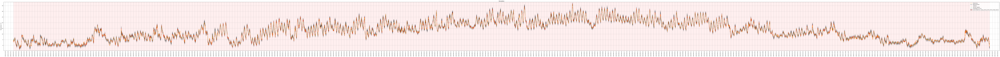

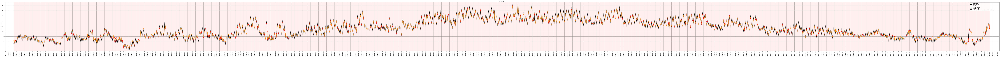

In [5]:

from common.data_reduction_strategy import DataReductionStrategy
import time
from tracemalloc import Snapshot
import tracemalloc
from simulation.mapek.utils import save_results
from common.sensor_adaptation_goal import SensorAdaptationGoal
import logging
from base.learning_strategy import LearningStrategy
from sensor.sensor_executor import SensorExecutor
from sensor.sensor_planner import SensorPlanner
from sensor.sensor_analyzer import SensorAnalyzer
from typing import Type
from sensor.sensor_monitor import SensorMonitor
import shutil
from base.cluster_adaptation_goal import ClusterAdaptationGoal
from base.cluster_knowledge import ClusterKnowledge
from simulation.mapek.simulation_base_station import ClusterManagerBaseStationGateway
from base.cluster_manager import ClusterManager
from base.model_manager import ModelManager
from base.dense_model_trainer import DenseModelTrainer
import tensorflow as tf
from tensorflow.keras.utils import disable_interactive_logging

RESULTS = {}
BS_MODELS_DIR = "bs_models"
SN_MODEL_DIR = "sn_models"


def clean_folder(folder: str):
    with os.scandir(folder) as entries:
        for entry in entries:
            if entry.is_dir():
                shutil.rmtree(entry.path)
            else:
                os.remove(entry.path)


def simulate(
        base_station: BaseStationGateway,
        initial_data: pd.DataFrame,
        monitor_type: Type[SensorMonitor],
        analyzer_type: Type[SensorAnalyzer],
        planner_type: Type[SensorPlanner],
        executor_type: Type[SensorExecutor],
        data_reduction_strategy: DataReductionStrategy,
) -> Tuple[SensorKnowledge, pd.DataFrame, Snapshot, float]:
    # Sensor configuration
    sensor = MultivariateSensorMock(sim_data)

    clean_folder(SN_MODEL_DIR)

    input_features = BASE_MODEL_METADATA.input_features
    output_features = BASE_MODEL_METADATA.output_features

    tracemalloc.start()
    measurements = initial_data.copy()
    sensor_manager = SensorManager(
        SN_MODEL_DIR, input_features, output_features, sensor, measurements, base_station,
        monitor_type, analyzer_type, planner_type, executor_type, data_reduction_strategy
    )
    process_time_start = time.process_time()
    sensor_manager.run()
    process_time_end = time.process_time()
    memory_snapshot: Snapshot = tracemalloc.take_snapshot()
    tracemalloc.stop()
    cpu_time: float = process_time_end - process_time_start

    return sensor_manager.knowledge, profiler.data, memory_snapshot, cpu_time


for simulation_id, parameters in simulations.items():
    sim_dir = os.path.join("simulations", simulation_id)
    os.makedirs(sim_dir, exist_ok=True)
    clean_folder(sim_dir)

    init_profiler(sim_dir + "log")
    profiler: Profiler = get_profiler()
    profiler.reset_data()

    base_model_id = parameters["base_model_id"]
    sim_sn_goals: list[SensorAdaptationGoal] = parameters["sn_goals"]
    sim_bs_goals: list[ClusterAdaptationGoal] = parameters["bs_goals"]

    clean_folder(BS_MODELS_DIR)

    sim_portfolio: list[str] = parameters["portfolio"]
    for model_id in sim_portfolio:
        source = os.path.join("models", model_id)
        dest = os.path.join(BS_MODELS_DIR, model_id)
        shutil.copytree(source, dest, dirs_exist_ok=True)

    model_trainer = DenseModelTrainer()
    model_manager = ModelManager("bs_models", base_model_id)
    base_model = model_manager.base_model
    training_df = pd.read_pickle("data/zamg_vienna_hourly.pickle")
    training_df = training_df[training_df.index.year == 2019]
    training_df = training_df[base_model.metadata.input_features]

    data_reduction_strategy: DataReductionStrategy = parameters["data_reduction_strategy"]
    learning_strategy: LearningStrategy = parameters["learning_strategy"](model_trainer, model_manager)

    knowledge = ClusterKnowledge(
        "base_station", model_manager, training_df, learning_strategy, data_reduction_strategy, sim_bs_goals,
        sim_sn_goals
    )
    executor = parameters["bs_executor"](knowledge)
    planner = parameters["bs_planner"](knowledge, executor)
    analyzer = parameters["bs_analyzer"](knowledge, planner)
    monitor = parameters["bs_monitor"](knowledge, analyzer)
    cluster_manager = ClusterManager("default_cluster", knowledge, monitor)

    base_station = ClusterManagerBaseStationGateway(cluster_manager, profiler, BS_MODELS_DIR)

    sim_parameters = {
        "sim_id": simulation_id,
        "portfolio": parameters["portfolio"],
        "base_model_id": parameters["base_model_id"],
        "sn_monitor": parameters["sn_monitor"].__name__,
        "sn_analyzer": parameters["sn_analyzer"].__name__,
        "sn_planner": parameters["sn_planner"].__name__,
        "sn_executor": parameters["sn_executor"].__name__,
        "sn_goals": [goal.to_dict() for goal in sim_sn_goals],
        "bs_monitor": parameters["bs_monitor"].__name__,
        "bs_analyzer": parameters["bs_analyzer"].__name__,
        "bs_planner": parameters["bs_planner"].__name__,
        "bs_executor": parameters["bs_executor"].__name__,
        "bs_goals": [goal.to_dict() for goal in sim_bs_goals],
    }
    parameters_file_path = os.path.join(sim_dir, "parameters.json")
    with open(parameters_file_path, "w") as fp:
        json.dump(sim_parameters, fp)

    executor = parameters["sn_executor"]
    planner = parameters["sn_planner"]
    analyzer = parameters["sn_analyzer"]
    monitor = parameters["sn_monitor"]

    stream_handler = logging.StreamHandler()
    file_handler = logging.FileHandler(filename=os.path.join(sim_dir, "logfile.log"), mode='w')
    logger = logging.getLogger()
    logger.setLevel(logging.INFO)
    logger.addHandler(file_handler)

    tf_logger = tf.get_logger()
    tf_logger.setLevel(logging.ERROR)
    tf_logger.handlers = []
    tf_logger.propagate = True

    disable_interactive_logging()

    knowledge, profiler_data, memory_snapshot, cpu_time = (
        simulate(base_station, initial_df, monitor, analyzer, planner, executor, data_reduction_strategy)
    )
    RESULTS[simulation_id] = (knowledge, profiler_data, memory_snapshot, cpu_time)

    for handler in logger.handlers[:]:
        handler.close()
        logger.removeHandler(handler)

    sim_dir = os.path.join("simulations", simulation_id)
    save_results(BS_MODELS_DIR, sim_dir, knowledge, profiler_data, sim_data, THRESHOLD, memory_snapshot, cpu_time)

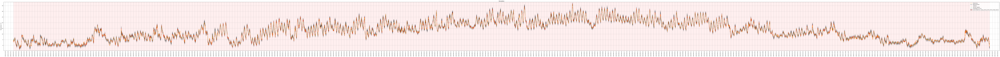

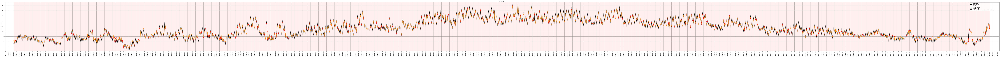

In [6]:
from simulation.mapek.utils import save_results

for simulation_id in RESULTS:
    (knowledge, profiler_data, memory_snapshot, cpu_time) = RESULTS[simulation_id]
    sim_dir = os.path.join("simulations", simulation_id)
    save_results(BS_MODELS_DIR, sim_dir, knowledge, profiler_data, sim_data, THRESHOLD, memory_snapshot, cpu_time)